In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
fatal: destination path 'mmsegmentation' already exists and is not an empty directory.


In [3]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla T4)


In [4]:
%cd mmsegmentation

/content/mmsegmentation


In [5]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [6]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [7]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

--2022-05-19 11:11:27--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  6.85MB/s    in 41s     

2022-05-19 11:12:10 (7.64 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [8]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 128]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [9]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [10]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 2

cfg.model.decode_head.loss_decode = dict(type='FocalLoss', loss_weight = 1.0)

In [11]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.val_pipeline = [
                    dict(type='LoadImageFromFile'),
                    dict(
                        type='MultiScaleFlipAug',
                        img_scale=(1024, 1024),
                        flip=False,
                        transforms=[
                                    dict(type='Resize', keep_ratio=True),
                                    dict(type='RandomFlip'),
                                    dict(
                                        type='Normalize',
                                        mean=[123.675, 116.28, 103.53],
                                        std=[58.395, 57.12, 57.375],
                                        to_rgb=True),
                                    dict(type='ImageToTensor', keys=['img']),
                                    dict(type='Collect', keys=['img'])
                                    ]),
                    
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            #dict(type='ResizeToMultiple', size_divisor=32),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [12]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_val_building.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/building_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/building_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/val/up.txt'

<pre><code>cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'
</code></pre>

In [13]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal'

In [14]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=2,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(type='FocalLoss', loss_weight=1.0)),
    train_cfg=dict(),
    test_cfg=dict(mode='slide'

### 모델 학습

In [15]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-19 11:12:14,853 - mmseg - INFO - Loaded 537 images
2022-05-19 11:12:29,270 - mmseg - INFO - Loaded 113 images
2022-05-19 11:12:29,274 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-19 11:12:29,709 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with shape torch.Size([19]) from checkpoint, the shape in current model is torch.Size([2]).
2022-05-19 11:12:29,711 - mmseg - INFO - Start running, host: root@f8c073efb495, work_dir: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal
2022-05-19 11:12:29,713 - mmseg - INFO - Hooks will be executed in the following order:
before_run

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 842s, ETA:     0s

2022-05-19 11:40:07,742 - mmseg - INFO - per class results:
2022-05-19 11:40:07,744 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.75 | 93.48 |
|  building  | 75.99 | 86.35 |
+------------+-------+-------+
2022-05-19 11:40:07,745 - mmseg - INFO - Summary:
2022-05-19 11:40:07,746 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.17 | 81.87 | 89.92 |
+-------+-------+-------+
2022-05-19 11:40:07,751 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9117, mIoU: 0.8187, mAcc: 0.8992, IoU.background: 0.8775, IoU.building: 0.7599, Acc.background: 0.9348, Acc.building: 0.8635
2022-05-19 11:40:49,347 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 8:06:29, time: 8.836, data_time: 8.446, memory: 3323, decode.loss_focal: 0.0385, decode.acc_seg: 87.8275, loss: 0.0385
2022-05-19 11:41:29,034 - mmseg - INFO - Iter [1200/20000]	lr: 4.508e-05, eta: 7:33:57, time: 0.397, d

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 783s, ETA:     0s

2022-05-19 12:00:21,325 - mmseg - INFO - per class results:
2022-05-19 12:00:21,327 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.05 | 94.16 |
|  building  | 78.43 |  88.0 |
+------------+-------+-------+
2022-05-19 12:00:21,329 - mmseg - INFO - Summary:
2022-05-19 12:00:21,332 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.17 | 83.74 | 91.08 |
+-------+-------+-------+
2022-05-19 12:00:21,333 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9217, mIoU: 0.8374, mAcc: 0.9108, IoU.background: 0.8905, IoU.building: 0.7843, Acc.background: 0.9416, Acc.building: 0.8800
2022-05-19 12:01:01,042 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 6:53:29, time: 8.231, data_time: 7.839, memory: 3323, decode.loss_focal: 0.0310, decode.acc_seg: 90.7746, loss: 0.0310
2022-05-19 12:01:43,181 - mmseg - INFO - Iter [2200/20000]	lr: 5.340e-05, eta: 6:38:09, time: 0.421, d

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 785s, ETA:     0s

2022-05-19 12:20:30,884 - mmseg - INFO - per class results:
2022-05-19 12:20:30,886 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.71 | 95.31 |
|  building  | 79.18 | 86.95 |
+------------+-------+-------+
2022-05-19 12:20:30,886 - mmseg - INFO - Summary:
2022-05-19 12:20:30,888 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 92.6 | 84.45 | 91.13 |
+------+-------+-------+
2022-05-19 12:20:30,889 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9260, mIoU: 0.8445, mAcc: 0.9113, IoU.background: 0.8971, IoU.building: 0.7918, Acc.background: 0.9531, Acc.building: 0.8695
2022-05-19 12:21:10,746 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 6:14:22, time: 8.252, data_time: 7.859, memory: 3323, decode.loss_focal: 0.0291, decode.acc_seg: 91.0754, loss: 0.0291
2022-05-19 12:21:50,400 - mmseg - INFO - Iter [3200/20000]	lr: 5.040e-05, eta: 6:03:59, time: 0.397, data_t

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 12:40:21,978 - mmseg - INFO - per class results:
2022-05-19 12:40:21,979 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.08 | 92.61 |
|  building  | 79.44 | 91.72 |
+------------+-------+-------+
2022-05-19 12:40:21,982 - mmseg - INFO - Summary:
2022-05-19 12:40:21,984 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.32 | 84.26 | 92.16 |
+-------+-------+-------+
2022-05-19 12:40:21,987 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9232, mIoU: 0.8426, mAcc: 0.9216, IoU.background: 0.8908, IoU.building: 0.7944, Acc.background: 0.9261, Acc.building: 0.9172
2022-05-19 12:41:01,636 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 5:43:16, time: 8.236, data_time: 7.845, memory: 3323, decode.loss_focal: 0.0270, decode.acc_seg: 91.4799, loss: 0.0270
2022-05-19 12:41:41,366 - mmseg - INFO - Iter [4200/20000]	lr: 4.740e-05, eta: 5:35:29, time: 0.397, d

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 13:00:13,752 - mmseg - INFO - per class results:
2022-05-19 13:00:13,753 - mmseg - INFO - 
+------------+-------+------+
|   Class    |  IoU  | Acc  |
+------------+-------+------+
| background | 90.37 | 96.2 |
|  building  | 80.13 | 86.5 |
+------------+-------+------+
2022-05-19 13:00:13,755 - mmseg - INFO - Summary:
2022-05-19 13:00:13,758 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.06 | 85.25 | 91.35 |
+-------+-------+-------+
2022-05-19 13:00:13,759 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9306, mIoU: 0.8525, mAcc: 0.9135, IoU.background: 0.9037, IoU.building: 0.8013, Acc.background: 0.9620, Acc.building: 0.8650
2022-05-19 13:00:53,722 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 5:16:39, time: 8.256, data_time: 7.862, memory: 3323, decode.loss_focal: 0.0240, decode.acc_seg: 92.5434, loss: 0.0240
2022-05-19 13:01:33,492 - mmseg - INFO - Iter [5200/20000]	lr: 4.440e-05, eta: 5:10:22, time: 0.398, data_ti

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 13:20:07,838 - mmseg - INFO - per class results:
2022-05-19 13:20:07,841 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.19 | 93.98 |
|  building  | 81.01 |  91.2 |
+------------+-------+-------+
2022-05-19 13:20:07,842 - mmseg - INFO - Summary:
2022-05-19 13:20:07,844 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.08 | 85.6 | 92.59 |
+-------+------+-------+
2022-05-19 13:20:07,846 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9308, mIoU: 0.8560, mAcc: 0.9259, IoU.background: 0.9019, IoU.building: 0.8101, Acc.background: 0.9398, Acc.building: 0.9120
2022-05-19 13:20:47,999 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 4:52:20, time: 8.240, data_time: 7.844, memory: 3323, decode.loss_focal: 0.0267, decode.acc_seg: 91.5455, loss: 0.0267
2022-05-19 13:21:27,778 - mmseg - INFO - Iter [6200/20000]	lr: 4.140e-05, eta: 4:47:01, time: 0.398, data_t

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 13:40:01,001 - mmseg - INFO - per class results:
2022-05-19 13:40:01,003 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.31 | 96.99 |
|  building  | 79.54 | 84.54 |
+------------+-------+-------+
2022-05-19 13:40:01,005 - mmseg - INFO - Summary:
2022-05-19 13:40:01,008 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.96 | 84.92 | 90.77 |
+-------+-------+-------+
2022-05-19 13:40:01,011 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9296, mIoU: 0.8492, mAcc: 0.9077, IoU.background: 0.9031, IoU.building: 0.7954, Acc.background: 0.9699, Acc.building: 0.8454
2022-05-19 13:40:41,223 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 4:29:13, time: 8.247, data_time: 7.850, memory: 3323, decode.loss_focal: 0.0233, decode.acc_seg: 92.9438, loss: 0.0233
2022-05-19 13:41:21,237 - mmseg - INFO - Iter [7200/20000]	lr: 3.840e-05, eta: 4:24:36, time: 0.400, d

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 13:59:53,700 - mmseg - INFO - per class results:
2022-05-19 13:59:53,702 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.64 | 95.43 |
|  building  | 81.19 | 88.94 |
+------------+-------+-------+
2022-05-19 13:59:53,703 - mmseg - INFO - Summary:
2022-05-19 13:59:53,704 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.33 | 85.91 | 92.19 |
+-------+-------+-------+
2022-05-19 13:59:53,706 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9333, mIoU: 0.8591, mAcc: 0.9219, IoU.background: 0.9064, IoU.building: 0.8119, Acc.background: 0.9543, Acc.building: 0.8894
2022-05-19 14:00:35,784 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 4:06:56, time: 8.258, data_time: 7.863, memory: 3323, decode.loss_focal: 0.0239, decode.acc_seg: 92.4808, loss: 0.0239
2022-05-19 14:01:15,825 - mmseg - INFO - Iter [8200/20000]	lr: 3.540e-05, eta: 4:02:50, time: 0.400, d

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 14:19:46,579 - mmseg - INFO - per class results:
2022-05-19 14:19:46,582 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.78 | 95.61 |
|  building  | 81.41 | 88.88 |
+------------+-------+-------+
2022-05-19 14:19:46,584 - mmseg - INFO - Summary:
2022-05-19 14:19:46,585 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.43 | 86.09 | 92.24 |
+-------+-------+-------+
2022-05-19 14:19:46,587 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9343, mIoU: 0.8609, mAcc: 0.9224, IoU.background: 0.9078, IoU.building: 0.8141, Acc.background: 0.9561, Acc.building: 0.8888
2022-05-19 14:20:26,533 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 3:45:06, time: 8.238, data_time: 7.844, memory: 3323, decode.loss_focal: 0.0236, decode.acc_seg: 92.4884, loss: 0.0236
2022-05-19 14:21:08,629 - mmseg - INFO - Iter [9200/20000]	lr: 3.240e-05, eta: 3:41:26, time: 0.421, d

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 14:39:39,261 - mmseg - INFO - per class results:
2022-05-19 14:39:39,263 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.93 | 95.59 |
|  building  | 81.75 | 89.29 |
+------------+-------+-------+
2022-05-19 14:39:39,265 - mmseg - INFO - Summary:
2022-05-19 14:39:39,267 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.55 | 86.34 | 92.44 |
+-------+-------+-------+
2022-05-19 14:39:39,268 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9355, mIoU: 0.8634, mAcc: 0.9244, IoU.background: 0.9093, IoU.building: 0.8175, Acc.background: 0.9559, Acc.building: 0.8929
2022-05-19 14:40:19,086 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 3:23:41, time: 8.242, data_time: 7.850, memory: 3323, decode.loss_focal: 0.0211, decode.acc_seg: 93.4445, loss: 0.0211
2022-05-19 14:40:58,838 - mmseg - INFO - Iter [10200/20000]	lr: 2.940e-05, eta: 3:20:17, time: 0.398,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 14:59:30,588 - mmseg - INFO - per class results:
2022-05-19 14:59:30,592 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.79 | 95.25 |
|  building  | 81.63 | 89.73 |
+------------+-------+-------+
2022-05-19 14:59:30,594 - mmseg - INFO - Summary:
2022-05-19 14:59:30,597 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.47 | 86.21 | 92.49 |
+-------+-------+-------+
2022-05-19 14:59:30,599 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9347, mIoU: 0.8621, mAcc: 0.9249, IoU.background: 0.9079, IoU.building: 0.8163, Acc.background: 0.9525, Acc.building: 0.8973
2022-05-19 15:00:10,522 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 3:02:32, time: 8.237, data_time: 7.843, memory: 3323, decode.loss_focal: 0.0219, decode.acc_seg: 92.9104, loss: 0.0219
2022-05-19 15:00:50,331 - mmseg - INFO - Iter [11200/20000]	lr: 2.640e-05, eta: 2:59:24, time: 0.398,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 15:19:22,278 - mmseg - INFO - per class results:
2022-05-19 15:19:22,279 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.9 | 94.71 |
|  building  | 82.15 | 91.23 |
+------------+-------+-------+
2022-05-19 15:19:22,280 - mmseg - INFO - Summary:
2022-05-19 15:19:22,283 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.58 | 86.52 | 92.97 |
+-------+-------+-------+
2022-05-19 15:19:22,287 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9358, mIoU: 0.8652, mAcc: 0.9297, IoU.background: 0.9090, IoU.building: 0.8215, Acc.background: 0.9471, Acc.building: 0.9123
2022-05-19 15:20:02,458 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 2:41:36, time: 8.240, data_time: 7.844, memory: 3323, decode.loss_focal: 0.0224, decode.acc_seg: 92.8698, loss: 0.0224
2022-05-19 15:20:42,253 - mmseg - INFO - Iter [12200/20000]	lr: 2.340e-05, eta: 2:38:40, time: 0.398,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 15:39:15,227 - mmseg - INFO - per class results:
2022-05-19 15:39:15,228 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.22 | 95.35 |
|  building  | 82.52 | 90.55 |
+------------+-------+-------+
2022-05-19 15:39:15,231 - mmseg - INFO - Summary:
2022-05-19 15:39:15,233 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.79 | 86.87 | 92.95 |
+-------+-------+-------+
2022-05-19 15:39:15,236 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9379, mIoU: 0.8687, mAcc: 0.9295, IoU.background: 0.9122, IoU.building: 0.8252, Acc.background: 0.9535, Acc.building: 0.9055
2022-05-19 15:39:55,038 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 2:20:50, time: 8.243, data_time: 7.850, memory: 3323, decode.loss_focal: 0.0208, decode.acc_seg: 93.4179, loss: 0.0208
2022-05-19 15:40:34,889 - mmseg - INFO - Iter [13200/20000]	lr: 2.040e-05, eta: 2:18:05, time: 0.398,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 15:59:09,018 - mmseg - INFO - per class results:
2022-05-19 15:59:09,019 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.19 | 95.57 |
|  building  | 82.34 | 89.97 |
+------------+-------+-------+
2022-05-19 15:59:09,020 - mmseg - INFO - Summary:
2022-05-19 15:59:09,022 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.76 | 86.77 | 92.77 |
+-------+-------+-------+
2022-05-19 15:59:09,024 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9376, mIoU: 0.8677, mAcc: 0.9277, IoU.background: 0.9119, IoU.building: 0.8234, Acc.background: 0.9557, Acc.building: 0.8997
2022-05-19 15:59:48,875 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 2:00:13, time: 8.241, data_time: 7.848, memory: 3323, decode.loss_focal: 0.0199, decode.acc_seg: 93.7374, loss: 0.0199
2022-05-19 16:00:28,877 - mmseg - INFO - Iter [14200/20000]	lr: 1.740e-05, eta: 1:57:37, time: 0.400,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 783s, ETA:     0s

2022-05-19 16:18:58,263 - mmseg - INFO - per class results:
2022-05-19 16:18:58,265 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.11 | 94.86 |
|  building  | 82.53 |  91.4 |
+------------+-------+-------+
2022-05-19 16:18:58,268 - mmseg - INFO - Summary:
2022-05-19 16:18:58,271 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.74 | 86.82 | 93.13 |
+-------+-------+-------+
2022-05-19 16:18:58,275 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9374, mIoU: 0.8682, mAcc: 0.9313, IoU.background: 0.9111, IoU.building: 0.8253, Acc.background: 0.9486, Acc.building: 0.9140
2022-05-19 16:19:40,133 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 1:39:40, time: 8.249, data_time: 7.856, memory: 3323, decode.loss_focal: 0.0213, decode.acc_seg: 93.1913, loss: 0.0213
2022-05-19 16:20:19,906 - mmseg - INFO - Iter [15200/20000]	lr: 1.440e-05, eta: 1:37:12, time: 0.398,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 783s, ETA:     0s

2022-05-19 16:38:48,197 - mmseg - INFO - per class results:
2022-05-19 16:38:48,199 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.29 | 95.72 |
|  building  | 82.48 | 89.85 |
+------------+-------+-------+
2022-05-19 16:38:48,199 - mmseg - INFO - Summary:
2022-05-19 16:38:48,203 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.82 | 86.89 | 92.79 |
+-------+-------+-------+
2022-05-19 16:38:48,205 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9382, mIoU: 0.8689, mAcc: 0.9279, IoU.background: 0.9129, IoU.building: 0.8248, Acc.background: 0.9572, Acc.building: 0.8985
2022-05-19 16:39:28,761 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 1:19:12, time: 8.237, data_time: 7.837, memory: 3323, decode.loss_focal: 0.0201, decode.acc_seg: 93.4962, loss: 0.0201
2022-05-19 16:40:12,132 - mmseg - INFO - Iter [16200/20000]	lr: 1.140e-05, eta: 1:16:51, time: 0.434,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 784s, ETA:     0s

2022-05-19 16:58:45,348 - mmseg - INFO - per class results:
2022-05-19 16:58:45,349 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.32 |  95.4 |
|  building  | 82.71 | 90.66 |
+------------+-------+-------+
2022-05-19 16:58:45,354 - mmseg - INFO - Summary:
2022-05-19 16:58:45,355 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.87 | 87.02 | 93.03 |
+-------+-------+-------+
2022-05-19 16:58:45,357 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9387, mIoU: 0.8702, mAcc: 0.9303, IoU.background: 0.9132, IoU.building: 0.8271, Acc.background: 0.9540, Acc.building: 0.9066
2022-05-19 16:59:25,368 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:58:49, time: 8.243, data_time: 7.849, memory: 3323, decode.loss_focal: 0.0209, decode.acc_seg: 93.1513, loss: 0.0209
2022-05-19 17:00:07,314 - mmseg - INFO - Iter [17200/20000]	lr: 8.403e-06, eta: 0:56:35, time: 0.419,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 783s, ETA:     0s

2022-05-19 17:18:37,543 - mmseg - INFO - per class results:
2022-05-19 17:18:37,545 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.48 | 95.94 |
|  building  | 82.78 | 89.81 |
+------------+-------+-------+
2022-05-19 17:18:37,546 - mmseg - INFO - Summary:
2022-05-19 17:18:37,549 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.96 | 87.13 | 92.87 |
+-------+-------+-------+
2022-05-19 17:18:37,551 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9396, mIoU: 0.8713, mAcc: 0.9287, IoU.background: 0.9148, IoU.building: 0.8278, Acc.background: 0.9594, Acc.building: 0.8981
2022-05-19 17:19:17,408 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:38:30, time: 8.229, data_time: 7.836, memory: 3323, decode.loss_focal: 0.0189, decode.acc_seg: 94.0697, loss: 0.0189
2022-05-19 17:19:57,324 - mmseg - INFO - Iter [18200/20000]	lr: 5.403e-06, eta: 0:36:20, time: 0.399,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 782s, ETA:     0s

2022-05-19 17:38:28,008 - mmseg - INFO - per class results:
2022-05-19 17:38:28,009 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.47 | 95.81 |
|  building  | 82.81 | 90.07 |
+------------+-------+-------+
2022-05-19 17:38:28,010 - mmseg - INFO - Summary:
2022-05-19 17:38:28,012 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.95 | 87.14 | 92.94 |
+-------+-------+-------+
2022-05-19 17:38:28,017 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9395, mIoU: 0.8714, mAcc: 0.9294, IoU.background: 0.9147, IoU.building: 0.8281, Acc.background: 0.9581, Acc.building: 0.9007
2022-05-19 17:39:08,055 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:18:13, time: 8.223, data_time: 7.828, memory: 3323, decode.loss_focal: 0.0197, decode.acc_seg: 93.8377, loss: 0.0197
2022-05-19 17:39:47,965 - mmseg - INFO - Iter [19200/20000]	lr: 2.403e-06, eta: 0:16:08, time: 0.399,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 783s, ETA:     0s

2022-05-19 17:58:19,140 - mmseg - INFO - per class results:
2022-05-19 17:58:19,142 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.46 | 95.66 |
|  building  | 82.88 | 90.39 |
+------------+-------+-------+
2022-05-19 17:58:19,145 - mmseg - INFO - Summary:
2022-05-19 17:58:19,147 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.96 | 87.17 | 93.03 |
+-------+-------+-------+
2022-05-19 17:58:19,149 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9396, mIoU: 0.8717, mAcc: 0.9303, IoU.background: 0.9146, IoU.building: 0.8288, Acc.background: 0.9566, Acc.building: 0.9039


### 모델 결과 시각화

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


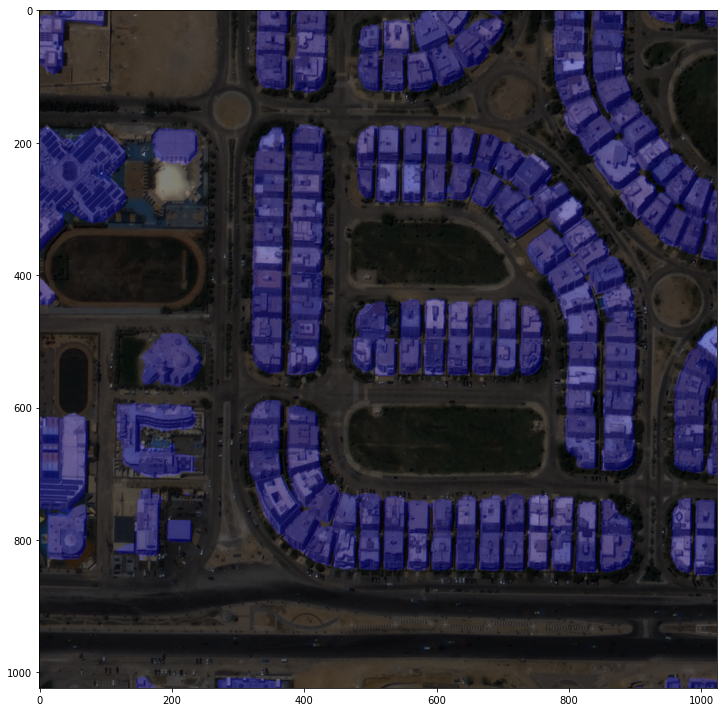

In [29]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00051_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


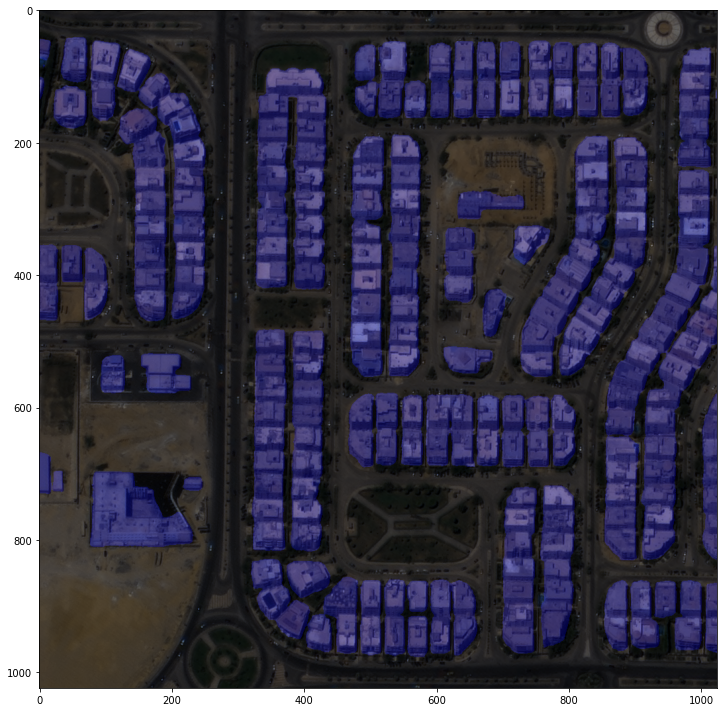

In [30]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00126_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


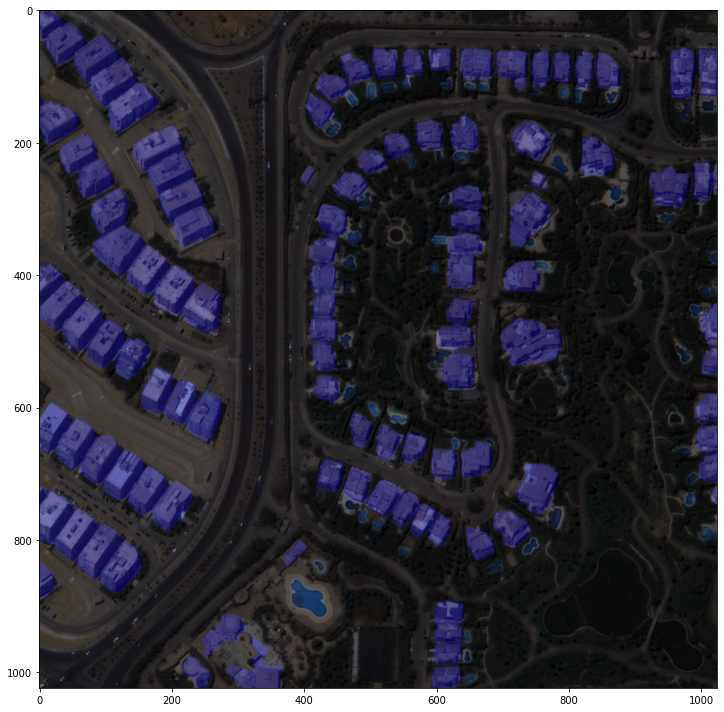

In [31]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00226_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


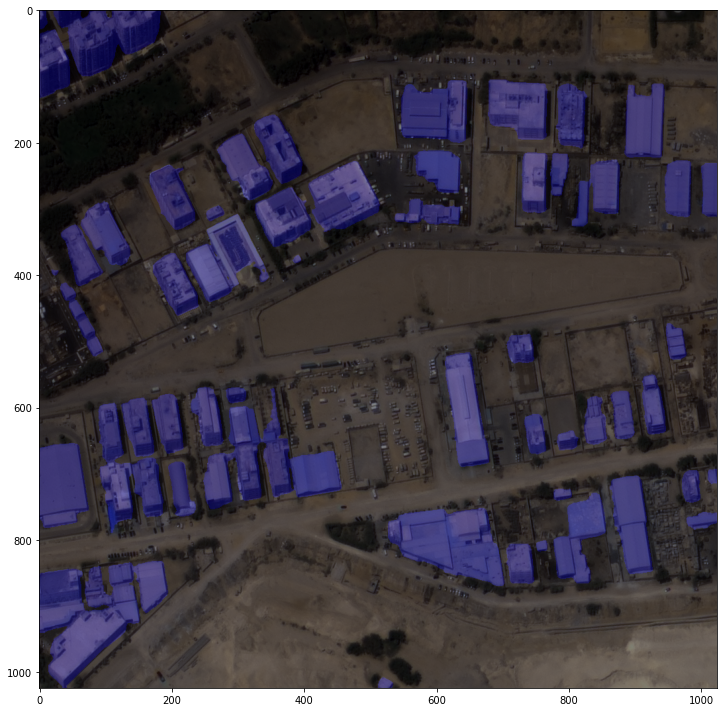

In [32]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00333_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


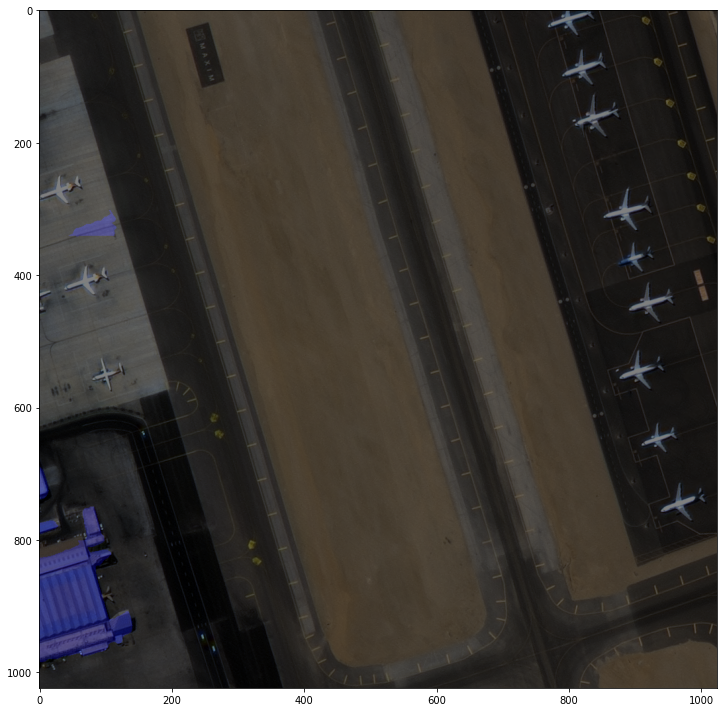

In [33]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00697_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


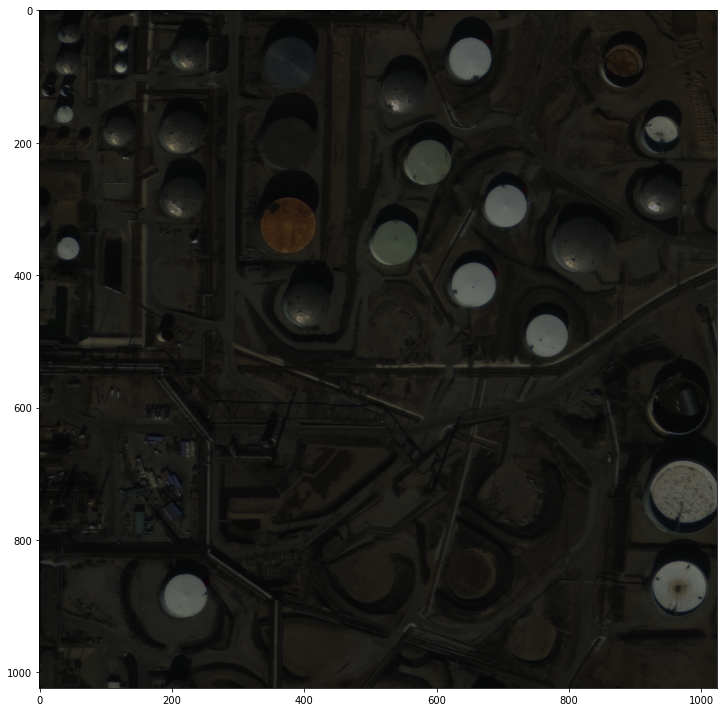

In [34]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD04404_PS3_K3A_NIA0378.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


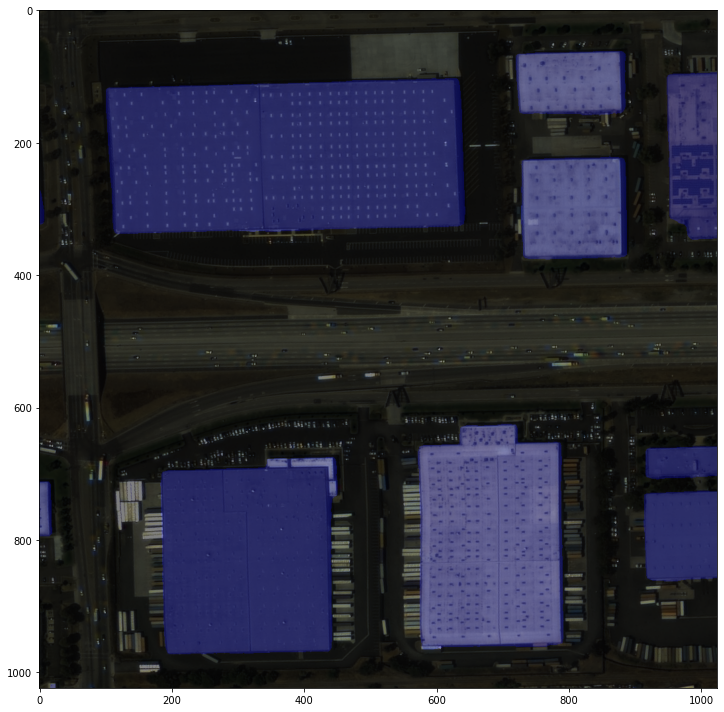

In [35]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD10921_PS3_K3A_NIA0389.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


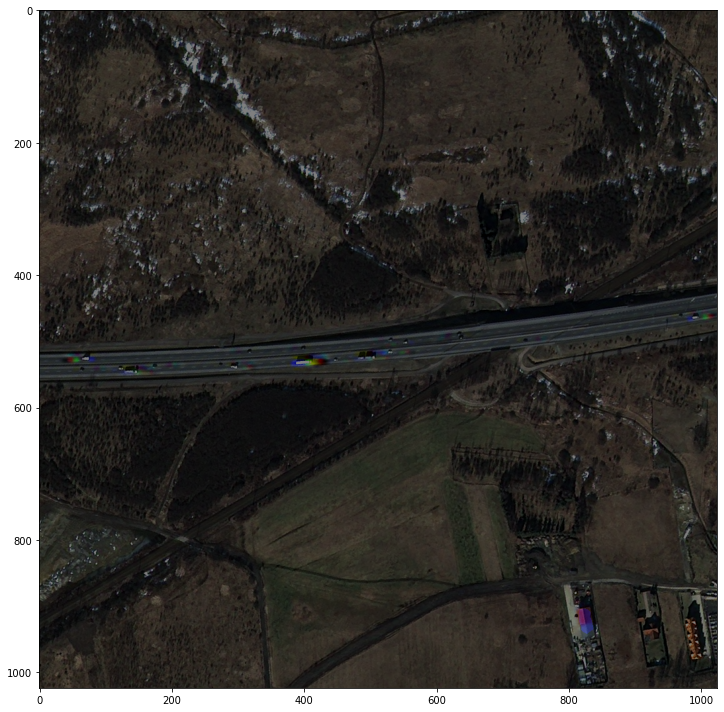

In [36]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ00176_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


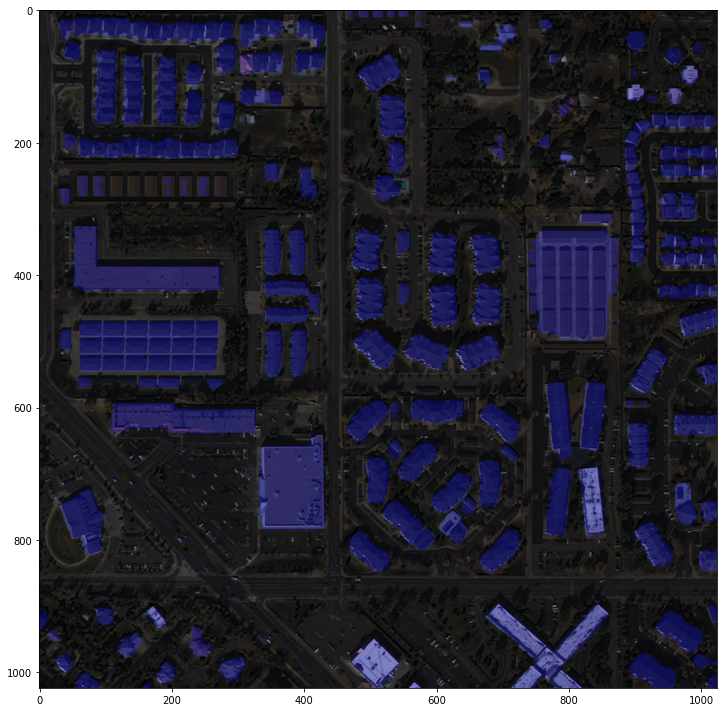

In [37]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ01050_PS3_K3_NIA0089.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


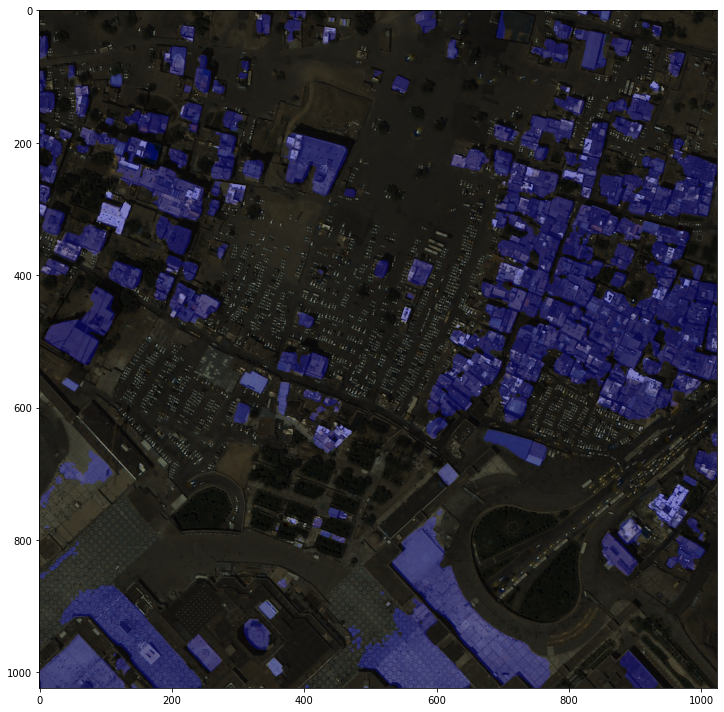

In [38]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ03670_PS3_K3A_NIA0153.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

#### 네이버 지도 이미지로 테스트

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


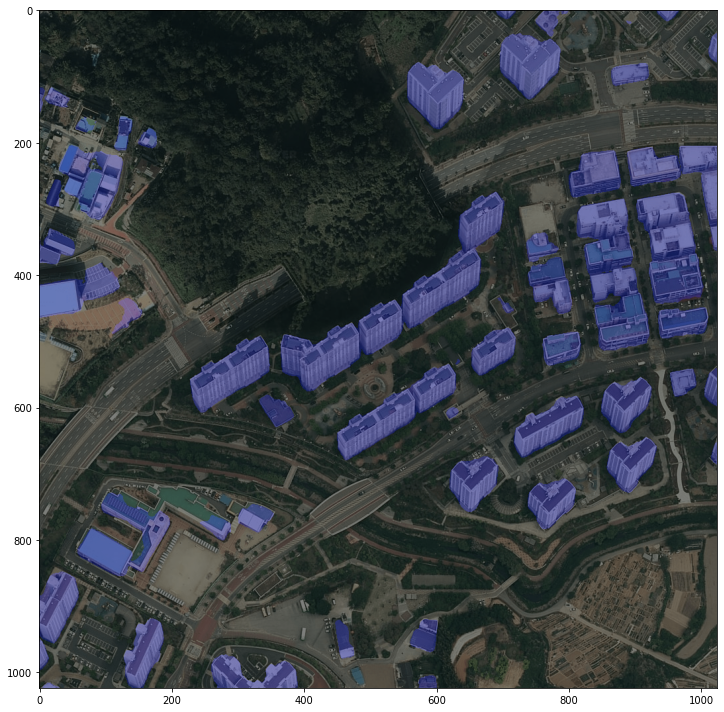

In [39]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


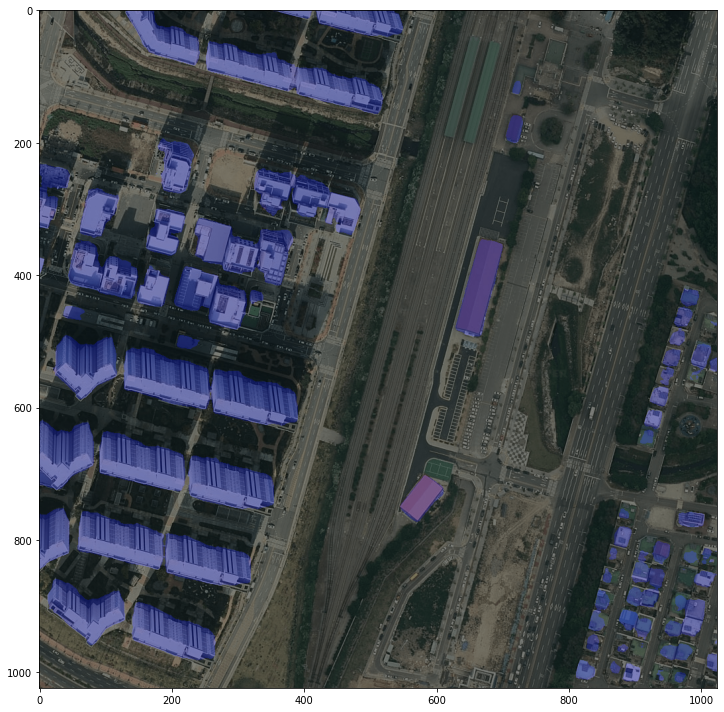

In [40]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


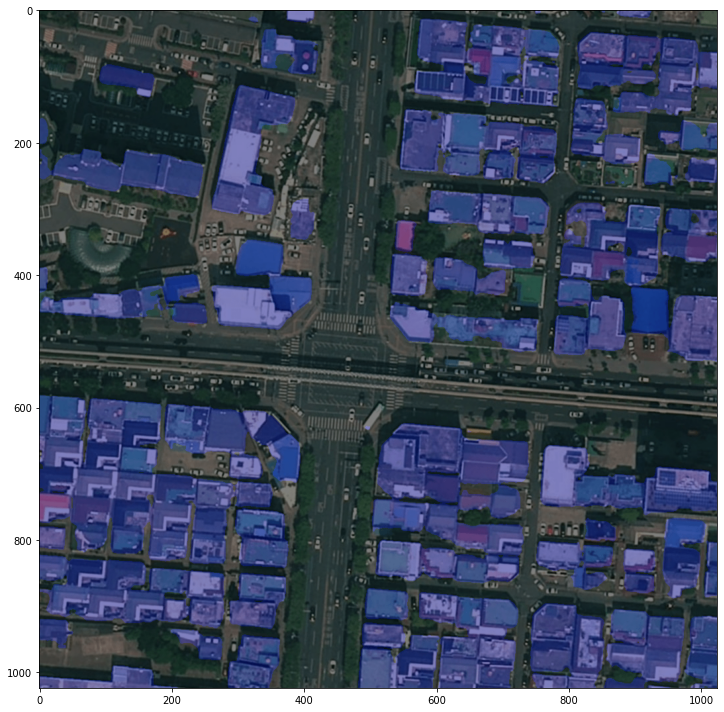

In [41]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)